In [1]:
pip install alpha_vantage pandas


Note: you may need to restart the kernel to use updated packages.


In [3]:
from alpha_vantage.timeseries import TimeSeries


from pprint import pprint

from datetime import date
from datetime import timedelta

import matplotlib.pyplot as plt 
import sys
import pandas as pd
import time
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import Ridge
import plotly.express as px
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

import math
from sklearn.metrics import r2_score
from numpy import arange
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.metrics import accuracy_score
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
import time
from tensorflow import keras
import numpy as np
from matplotlib import pyplot






In [36]:
# Obtaining stock data from alpha vantage 
sym='VOO'


# funtion to obtain data from alpha vantage API
def stock_data(sym, date_of_data):
    
    ts = TimeSeries(key='SUXOFAIGXM6HEP9Y', output_format='pandas')
    data, meta_data = ts.get_daily_adjusted(symbol=sym, outputsize='full')
    data_date_changed = data[:date_of_data]
    data_date_changed['Ticker']= sym
    return data_date_changed

In [37]:
# Function to plot interactive plots using Plotly Express
def interactive_plot(df, title):
  fig = px.line(title = title)
  for i in df.columns[1:]:
    fig.add_scatter(x = df['date'], y = df[i], name = i)
  fig.show()

In [38]:
data_dated= stock_data(sym,'2015-01-01')

In [39]:
data_dated.head(10)

,1. open,2. high,3. low,4. close,5. adjusted close,6. volume,7. dividend amount,8. split coefficient,Ticker
date,,,,,,,,,
2021-04-08,374.97,375.5600,374.0600,375.55,375.550000,3924034.0,0.0000,1.0,VOO
2021-04-07,373.14,374.0797,372.7200,373.73,373.730000,2768895.0,0.0000,1.0,VOO
2021-04-06,373.04,374.3300,372.6700,373.26,373.260000,3583491.0,0.0000,1.0,VOO
2021-04-05,370.89,374.0700,370.8100,373.47,373.470000,3764095.0,0.0000,1.0,VOO
2021-04-01,366.20,368.2900,366.0300,368.16,368.160000,5131981.0,0.0000,1.0,VOO
2021-03-31,363.39,365.8200,363.3900,364.30,364.300000,7470344.0,0.0000,1.0,VOO
2021-03-30,362.56,363.4700,361.2700,362.86,362.860000,3696168.0,0.0000,1.0,VOO
2021-03-29,362.57,364.6800,361.1097,363.79,363.790000,3143331.0,0.0000,1.0,VOO
2021-03-26,359.37,364.3700,358.7500,364.01,364.010000,3322643.0,1.2625,1.0,VOO


In [8]:
# Check if Null values exist in stock prices data
data_dated.isnull().sum()

1. open                 0
2. high                 0
3. low                  0
4. close                0
5. adjusted close       0
6. volume               0
7. dividend amount      0
8. split coefficient    0
Ticker                  0
dtype: int64

In [9]:
# Get stock prices dataframe info
data_dated.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1577 entries, 2021-04-08 to 2015-01-02
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   1. open               1577 non-null   float64
 1   2. high               1577 non-null   float64
 2   3. low                1577 non-null   float64
 3   4. close              1577 non-null   float64
 4   5. adjusted close     1577 non-null   float64
 5   6. volume             1577 non-null   float64
 6   7. dividend amount    1577 non-null   float64
 7   8. split coefficient  1577 non-null   float64
 8   Ticker                1577 non-null   object 
dtypes: float64(8), object(1)
memory usage: 123.2+ KB


In [10]:
data_dated.describe()

,1. open,2. high,3. low,4. close,5. adjusted close,6. volume,7. dividend amount,8. split coefficient
count,1577.000000,1577.000000,1577.000000,1577.000000,1577.000000,1.577000e+03,1577.000000,1577.000000
mean,170.144515,171.919414,168.472926,170.292679,50.091160,4.481613e+07,0.009765,1.001902
std,71.740472,72.790015,70.931586,72.017324,29.947759,3.376211e+07,0.079542,0.075545
min,90.000000,91.670000,89.470000,90.340000,21.131248,1.136204e+07,0.000000,1.000000
25%,117.520000,118.705000,116.330000,117.340000,28.134139,2.514149e+07,0.000000,1.000000
50%,151.800000,153.840000,150.050000,152.540000,40.972112,3.357846e+07,0.000000,1.000000
75%,197.990000,199.850000,195.930000,197.920000,54.845728,4.989991e+07,0.000000,1.000000
max,514.790000,515.140000,500.330000,506.090000,142.945728,3.326072e+08,0.820000,4.000000


Text(0.5, 1.0, 'Multi-Collinearity of Car Attributes')

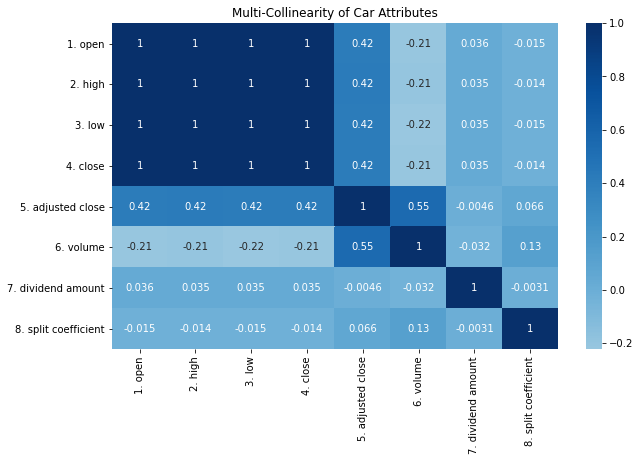

In [11]:
fig, ax = plt.subplots(figsize=(10,6))
sns.heatmap(data_dated.corr(), center=0, cmap='Blues' , annot=True)
ax.set_title('Multi-Collinearity of Car Attributes')

In [12]:
# Function to return the input/output (target) data for AI/ML Model
# Note that our goal is to predict the future stock price 
# Target stock price today will be tomorrow's price 
def trading_window(data,days):
  
  # 1 day window 
#   n = 1

  # Create a column containing the prices for the next 1 days
  data['Target'] = data[['4. close']].shift(-days)
  
  # return the new dataset 
  return data

In [13]:
df=data_dated.copy()

In [14]:
# calculate the change in price from the previous day
data_dated['change_in_price'] = data_dated['4. close'].diff()

In [15]:
data_dated

,1. open,2. high,3. low,4. close,5. adjusted close,6. volume,7. dividend amount,8. split coefficient,Ticker,change_in_price
date,,,,,,,,,,
2021-04-08,128.95,130.3900,128.520,130.36,130.360000,88308977.0,0.0,1.0,AAPL,NaN
2021-04-07,125.83,127.9200,125.140,127.90,127.900000,83466716.0,0.0,1.0,AAPL,-2.46
2021-04-06,126.50,127.1300,125.650,126.21,126.210000,80171253.0,0.0,1.0,AAPL,-1.69
2021-04-05,123.87,126.1601,123.070,125.90,125.900000,88651175.0,0.0,1.0,AAPL,-0.31
2021-04-01,123.66,124.1800,122.490,123.00,123.000000,75089134.0,0.0,1.0,AAPL,-2.90
...,...,...,...,...,...,...,...,...,...,...
2015-01-08,109.23,112.1500,108.700,111.89,25.441309,59364547.0,0.0,1.0,AAPL,-0.12
2015-01-07,107.20,108.2000,106.695,107.75,24.499965,40105934.0,0.0,1.0,AAPL,-4.14
2015-01-06,106.54,107.4300,104.630,106.26,24.161172,65797116.0,0.0,1.0,AAPL,-1.49


In [16]:
# calculating the Relative Strength Index

def calc_RSI(data_dated):
    # Calculate the 14 day RSI
    n = 14

    # First make a copy of the data frame twice
    up_df, down_df = data_dated[['Ticker','change_in_price']].copy(), data_dated[['Ticker','change_in_price']].copy()

    # For up days, if the change is less than 0 set to 0.
    up_df.loc['change_in_price'] = up_df.loc[(up_df['change_in_price'] < 0), 'change_in_price'] = 0

    # For down days, if the change is greater than 0 set to 0.
    down_df.loc['change_in_price'] = down_df.loc[(down_df['change_in_price'] > 0), 'change_in_price'] = 0

    # We need change in price to be absolute.
    down_df['change_in_price'] = down_df['change_in_price'].abs()

    # Calculate the EWMA (Exponential Weighted Moving Average), meaning older values are given less weight compared to newer values.
    ewma_up = up_df.groupby('Ticker')['change_in_price'].transform(lambda x: x.ewm(span = n).mean())
    ewma_down = down_df.groupby('Ticker')['change_in_price'].transform(lambda x: x.ewm(span = n).mean())

    # Calculate the Relative Strength
    relative_strength = ewma_up / ewma_down

    # Calculate the Relative Strength Index
    relative_strength_index = 100.0 - (100.0 / (1.0 + relative_strength))

    # Add the info to the data frame.
    data_dated['down_days'] = down_df['change_in_price']
    data_dated['up_days'] = up_df['change_in_price']
    data_dated['RSI'] = relative_strength_index

calc_RSI(data_dated)
# Display the head.
data_dated.head(30)

,1. open,2. high,3. low,4. close,5. adjusted close,6. volume,7. dividend amount,8. split coefficient,Ticker,change_in_price,down_days,up_days,RSI
date,,,,,,,,,,,,,
2021-04-08,128.95,130.3900,128.5200,130.360,130.360,88308977.0,0.0,1.0,AAPL,NaN,NaN,NaN,NaN
2021-04-07,125.83,127.9200,125.1400,127.900,127.900,83466716.0,0.0,1.0,AAPL,-2.460,2.460,0.000,0.000000
2021-04-06,126.50,127.1300,125.6500,126.210,126.210,80171253.0,0.0,1.0,AAPL,-1.690,1.690,0.000,0.000000
2021-04-05,123.87,126.1601,123.0700,125.900,125.900,88651175.0,0.0,1.0,AAPL,-0.310,0.310,0.000,0.000000
2021-04-01,123.66,124.1800,122.4900,123.000,123.000,75089134.0,0.0,1.0,AAPL,-2.900,2.900,0.000,0.000000
2021-03-31,121.65,123.5200,121.1500,122.150,122.150,118323826.0,0.0,1.0,AAPL,-0.850,0.850,0.000,0.000000
2021-03-30,120.11,120.4031,118.8600,119.900,119.900,85671919.0,0.0,1.0,AAPL,-2.250,2.250,0.000,0.000000
2021-03-29,121.65,122.5800,120.7299,121.390,121.390,80819203.0,0.0,1.0,AAPL,1.490,0.000,1.490,18.602029
2021-03-26,120.35,121.4800,118.9200,121.210,121.210,94071234.0,0.0,1.0,AAPL,-0.180,0.180,0.000,18.131878


In [17]:
# Claclulting the Stochastic Oscillator
def stochastic_Oscillator(data_dated):

    # Calculate the Stochastic Oscillator
    n = 14

    # Make a copy of the high and low column.
    low_14, high_14 = data_dated[['Ticker','3. low']].copy(), data_dated[['Ticker','2. high']].copy()

    # Group by symbol, then apply the rolling function and grab the Min and Max.
    low_14 = low_14.groupby('Ticker')['3. low'].transform(lambda x: x.rolling(window = n).min())
    high_14 = high_14.groupby('Ticker')['2. high'].transform(lambda x: x.rolling(window = n).max())

    # Calculate the Stochastic Oscillator.
    k_percent = 100 * ((data_dated['4. close'] - low_14) / (high_14 - low_14))

    # Add the info to the data frame.
    data_dated['low_14'] = low_14
    data_dated['high_14'] = high_14
    data_dated['k_percent'] = k_percent


stochastic_Oscillator(data_dated)
# Display the head.
data_dated.head(5)

,1. open,2. high,3. low,4. close,5. adjusted close,6. volume,7. dividend amount,8. split coefficient,Ticker,change_in_price,down_days,up_days,RSI,low_14,high_14,k_percent
date,,,,,,,,,,,,,,,,
2021-04-08,128.95,130.3900,128.52,130.36,130.36,88308977.0,0.0,1.0,AAPL,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-04-07,125.83,127.9200,125.14,127.90,127.90,83466716.0,0.0,1.0,AAPL,-2.46,2.46,0.0,0.0,NaN,NaN,NaN
2021-04-06,126.50,127.1300,125.65,126.21,126.21,80171253.0,0.0,1.0,AAPL,-1.69,1.69,0.0,0.0,NaN,NaN,NaN
2021-04-05,123.87,126.1601,123.07,125.90,125.90,88651175.0,0.0,1.0,AAPL,-0.31,0.31,0.0,0.0,NaN,NaN,NaN
2021-04-01,123.66,124.1800,122.49,123.00,123.00,75089134.0,0.0,1.0,AAPL,-2.90,2.90,0.0,0.0,NaN,NaN,NaN


In [18]:
# calculating williams R%
def calc_williams_r(data_dated):
# Calculate the Williams %R
    n = 14
    # Make a copy of the high and low column.
    low_14, high_14 = data_dated[['Ticker','3. low']].copy(), data_dated[['Ticker','2. high']].copy()
    # Group by symbol, then apply the rolling function and grab the Min and Max.
    low_14 = low_14.groupby('Ticker')['3. low'].transform(lambda x: x.rolling(window = n).min())
    high_14 = high_14.groupby('Ticker')['2. high'].transform(lambda x: x.rolling(window = n).max())
    # Calculate William %R indicator.
    r_percent = ((high_14 - data_dated['4. close']) / (high_14 - low_14)) * - 100
    # Add the info to the data frame.
    data_dated['r_percent'] = r_percent


calc_williams_r(data_dated)
# Display the head.
data_dated.head(5)

,1. open,2. high,3. low,4. close,5. adjusted close,6. volume,7. dividend amount,8. split coefficient,Ticker,change_in_price,down_days,up_days,RSI,low_14,high_14,k_percent,r_percent
date,,,,,,,,,,,,,,,,,
2021-04-08,128.95,130.3900,128.52,130.36,130.36,88308977.0,0.0,1.0,AAPL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-04-07,125.83,127.9200,125.14,127.90,127.90,83466716.0,0.0,1.0,AAPL,-2.46,2.46,0.0,0.0,NaN,NaN,NaN,NaN
2021-04-06,126.50,127.1300,125.65,126.21,126.21,80171253.0,0.0,1.0,AAPL,-1.69,1.69,0.0,0.0,NaN,NaN,NaN,NaN
2021-04-05,123.87,126.1601,123.07,125.90,125.90,88651175.0,0.0,1.0,AAPL,-0.31,0.31,0.0,0.0,NaN,NaN,NaN,NaN
2021-04-01,123.66,124.1800,122.49,123.00,123.00,75089134.0,0.0,1.0,AAPL,-2.90,2.90,0.0,0.0,NaN,NaN,NaN,NaN


In [19]:
# calculating the Moving Average Convergence Divergnece (MACD)
def calc_macd(data_dated):
    # Calculate the MACD
    ema_26 = data_dated.groupby('Ticker')['4. close'].transform(lambda x: x.ewm(span = 26).mean())
    ema_12 = data_dated.groupby('Ticker')['4. close'].transform(lambda x: x.ewm(span = 12).mean())
    macd = ema_12 - ema_26

    # Calculate the EMA
    ema_9_macd = macd.ewm(span = 9).mean()

    # Store the data in the data frame.
    data_dated['MACD'] = macd
    data_dated['MACD_EMA'] = ema_9_macd
    

calc_macd(data_dated)   
# Print the head.
data_dated.head(5)

,1. open,2. high,3. low,4. close,5. adjusted close,6. volume,7. dividend amount,8. split coefficient,Ticker,change_in_price,down_days,up_days,RSI,low_14,high_14,k_percent,r_percent,MACD,MACD_EMA
date,,,,,,,,,,,,,,,,,,,
2021-04-08,128.95,130.3900,128.52,130.36,130.36,88308977.0,0.0,1.0,AAPL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000
2021-04-07,125.83,127.9200,125.14,127.90,127.90,83466716.0,0.0,1.0,AAPL,-2.46,2.46,0.0,0.0,NaN,NaN,NaN,NaN,-0.055192,-0.030662
2021-04-06,126.50,127.1300,125.65,126.21,126.21,80171253.0,0.0,1.0,AAPL,-1.69,1.69,0.0,0.0,NaN,NaN,NaN,NaN,-0.122733,-0.068396
2021-04-05,123.87,126.1601,123.07,125.90,125.90,88651175.0,0.0,1.0,AAPL,-0.31,0.31,0.0,0.0,NaN,NaN,NaN,NaN,-0.161636,-0.099981
2021-04-01,123.66,124.1800,122.49,123.00,123.00,75089134.0,0.0,1.0,AAPL,-2.90,2.90,0.0,0.0,NaN,NaN,NaN,NaN,-0.294770,-0.157927


In [20]:
# calculating the price rate of change 
def calc_price_rate_of_change(data_dated):
    # Calculate the Price Rate of Change
    n = 9

    # Calculate the Rate of Change in the Price, and store it in the Data Frame.
    data_dated['Price_Rate_Of_Change'] = data_dated.groupby('Ticker')['4. close'].transform(lambda x: x.pct_change(periods = n))

calc_price_rate_of_change(data_dated)
# Print the first 30 rows
data_dated.head(5)

,1. open,2. high,3. low,4. close,5. adjusted close,6. volume,7. dividend amount,8. split coefficient,Ticker,change_in_price,down_days,up_days,RSI,low_14,high_14,k_percent,r_percent,MACD,MACD_EMA,Price_Rate_Of_Change
date,,,,,,,,,,,,,,,,,,,,
2021-04-08,128.95,130.3900,128.52,130.36,130.36,88308977.0,0.0,1.0,AAPL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN
2021-04-07,125.83,127.9200,125.14,127.90,127.90,83466716.0,0.0,1.0,AAPL,-2.46,2.46,0.0,0.0,NaN,NaN,NaN,NaN,-0.055192,-0.030662,NaN
2021-04-06,126.50,127.1300,125.65,126.21,126.21,80171253.0,0.0,1.0,AAPL,-1.69,1.69,0.0,0.0,NaN,NaN,NaN,NaN,-0.122733,-0.068396,NaN
2021-04-05,123.87,126.1601,123.07,125.90,125.90,88651175.0,0.0,1.0,AAPL,-0.31,0.31,0.0,0.0,NaN,NaN,NaN,NaN,-0.161636,-0.099981,NaN
2021-04-01,123.66,124.1800,122.49,123.00,123.00,75089134.0,0.0,1.0,AAPL,-2.90,2.90,0.0,0.0,NaN,NaN,NaN,NaN,-0.294770,-0.157927,NaN


In [21]:
 data_dated.reset_index(inplace = True)

In [22]:
data_dated.head(25)

,date,1. open,2. high,3. low,4. close,5. adjusted close,6. volume,7. dividend amount,8. split coefficient,Ticker,...,down_days,up_days,RSI,low_14,high_14,k_percent,r_percent,MACD,MACD_EMA,Price_Rate_Of_Change
0,2021-04-08,128.95,130.3900,128.5200,130.360,130.360,88308977.0,0.0,1.0,AAPL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN
1,2021-04-07,125.83,127.9200,125.1400,127.900,127.900,83466716.0,0.0,1.0,AAPL,...,2.460,0.000,0.000000,NaN,NaN,NaN,NaN,-0.055192,-0.030662,NaN
2,2021-04-06,126.50,127.1300,125.6500,126.210,126.210,80171253.0,0.0,1.0,AAPL,...,1.690,0.000,0.000000,NaN,NaN,NaN,NaN,-0.122733,-0.068396,NaN
3,2021-04-05,123.87,126.1601,123.0700,125.900,125.900,88651175.0,0.0,1.0,AAPL,...,0.310,0.000,0.000000,NaN,NaN,NaN,NaN,-0.161636,-0.099981,NaN
4,2021-04-01,123.66,124.1800,122.4900,123.000,123.000,75089134.0,0.0,1.0,AAPL,...,2.900,0.000,0.000000,NaN,NaN,NaN,NaN,-0.294770,-0.157927,NaN
5,2021-03-31,121.65,123.5200,121.1500,122.150,122.150,118323826.0,0.0,1.0,AAPL,...,0.850,0.000,0.000000,NaN,NaN,NaN,NaN,-0.405608,-0.225062,NaN
6,2021-03-30,120.11,120.4031,118.8600,119.900,119.900,85671919.0,0.0,1.0,AAPL,...,2.250,0.000,0.000000,NaN,NaN,NaN,NaN,-0.571631,-0.312770,NaN
7,2021-03-29,121.65,122.5800,120.7299,121.390,121.390,80819203.0,0.0,1.0,AAPL,...,0.000,1.490,18.602029,NaN,NaN,NaN,NaN,-0.602900,-0.382493,NaN
8,2021-03-26,120.35,121.4800,118.9200,121.210,121.210,94071234.0,0.0,1.0,AAPL,...,0.180,0.000,18.131878,NaN,NaN,NaN,NaN,-0.624310,-0.438354,NaN
9,2021-03-25,119.54,121.6600,119.0000,120.590,120.590,98844681.0,0.0,1.0,AAPL,...,0.620,0.000,16.476806,NaN,NaN,NaN,NaN,-0.662351,-0.488542,-0.074946


In [23]:
def show_plot(data, title):
  plt.figure(figsize = (13, 5))
  plt.plot(data, linewidth = 3)
  plt.title(title)
  plt.grid()

In [24]:
sc = MinMaxScaler(feature_range = (0, 1))

In [25]:
time.sleep(60)

In [26]:
starting_date='2015-01-01'
pd.options.mode.chained_assignment = None  # default='warn'

def pricePrediction_LR(symbol,days, starting_date):
#     obtain stock data
    stock_df= stock_data(symbol,starting_date)
    
    
    #     obtaining technical indicators
    stochastic_Oscillator(stock_df)
    calc_williams_r(stock_df)
    calc_macd(stock_df)
    calc_price_rate_of_change(stock_df)
    
#     set the trading window we are trying to predict
    stock_df_targeted = trading_window(stock_df,days)
# #     remove the last column of the data as it will be null
#     stock_df_targeted= stock_df_targeted[:-1]

    
    stock_df_targeted.reset_index(inplace = True)
    stock_df_targeted = stock_df_targeted.dropna()
    
    stock_df_targeted_scaled= stock_df_targeted
    stock_df_targeted_scaled.head(10)
    stock_df_targeted_scaled.drop(['Ticker','1. open','2. high','3. low', '5. adjusted close', '6. volume', '8. split coefficient', 'low_14','high_14','MACD_EMA'], axis = 1, inplace=True)
    
    
    stock_df_targeted_scaled = sc.fit_transform(stock_df_targeted_scaled.drop(columns = ['date']))
    
    # Creating Feature and Target
    X = stock_df_targeted_scaled[:,:6]
    y = stock_df_targeted_scaled[:,6:]
    
    split = int(0.65 * len(X))
    X_train = X[:split]
    y_train = y[:split]
    X_test = X[split:]
    y_test = y[split:]

    show_plot(X_train, 'Training Data')
    show_plot(X_test, 'Testing Data')
    
    regression_model = Ridge()
    regression_model.fit(X_train, y_train)
    
    lr_accuracy = regression_model.score(X_test, y_test)
    predicted_prices = regression_model.predict(X)
    
    
    print("Linear Regression Score: ", lr_accuracy)
    print('RMSE: ' + str(math.sqrt(mean_squared_error(y, predicted_prices))))
    print('Rsquared '+ str(r2_score(y, predicted_prices)))
    print('MAE: ' + str(mean_absolute_error(y, predicted_prices)))
    

    
    Predicted = []
    for i in predicted_prices:
        Predicted.append(i[0])
        
    close = []
    for i in stock_df_targeted_scaled:
        close.append(i[0])
    
    df_predicted = stock_df_targeted[['date']]
    df_predicted['Close'] = close
    df_predicted['Prediction'] = Predicted
    
    interactive_plot(df_predicted, "Original Vs. Prediction")
    
    

Linear Regression Score:  0.7972720610713377
RMSE: 0.025742330977734828
Rsquared 0.9780130568683535
MAE: 0.010565506624585129


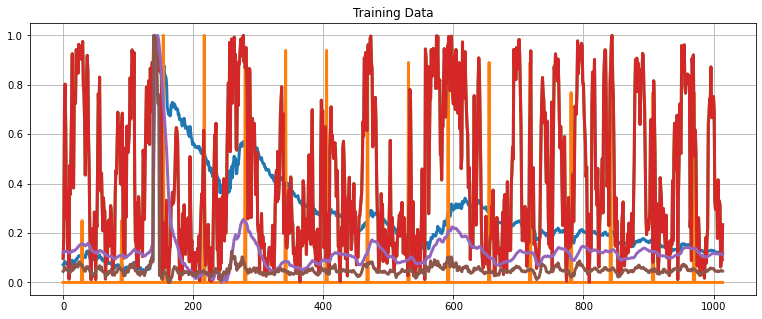

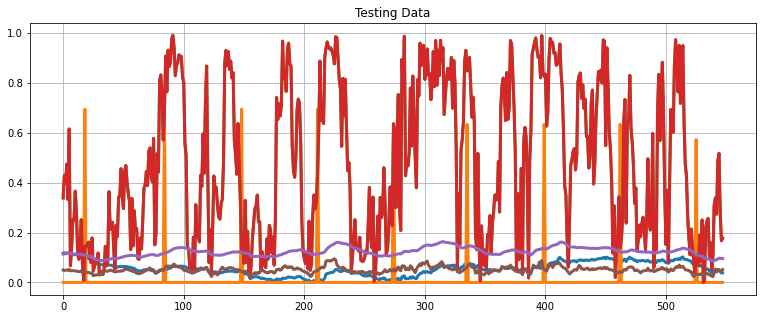

In [27]:
 pricePrediction_LR('AAPL', 1,starting_date )

Linear Regression Score:  0.8977012655293357
RMSE: 0.016930119755725826
Rsquared 0.9946986518668928
MAE: 0.012253122021437074


Linear Regression Score:  0.38516032776515474
RMSE: 0.044873725271378305
Rsquared 0.9630733791084093
MAE: 0.03254480731341779


Linear Regression Score:  -1.5280157946535784
RMSE: 0.07799218766335995
Rsquared 0.8868256498659701
MAE: 0.05855517274279312


Linear Regression Score:  -4.932492648678213
RMSE: 0.10599103980761446
Rsquared 0.7975846197903006
MAE: 0.08579411412746794


Linear Regression Score:  -7.90620617426673
RMSE: 0.12363005271263341
Rsquared 0.7396083381003868
MAE: 0.10343944721007159


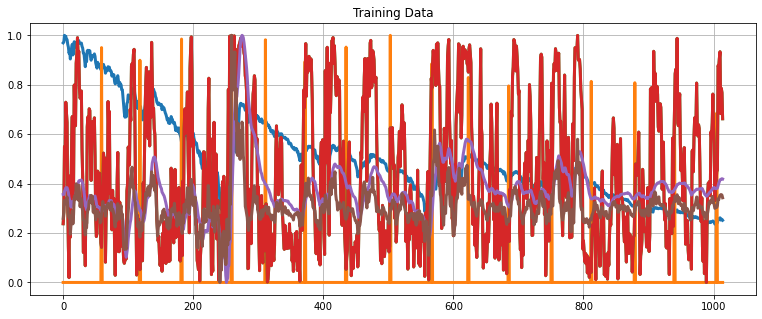

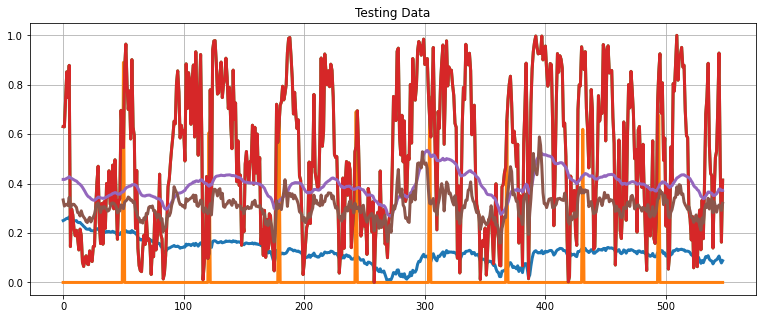

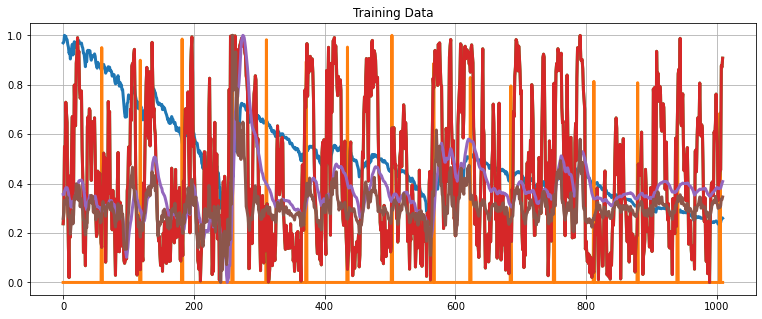

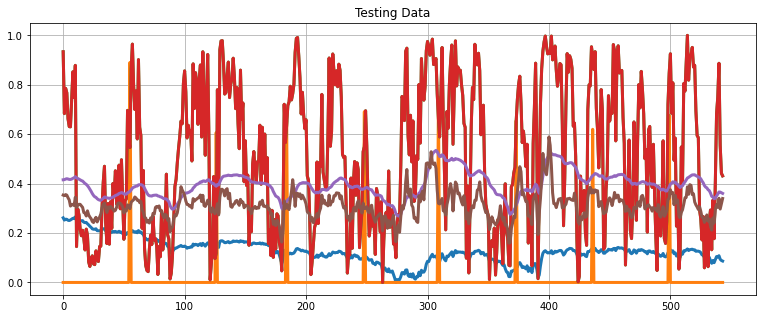

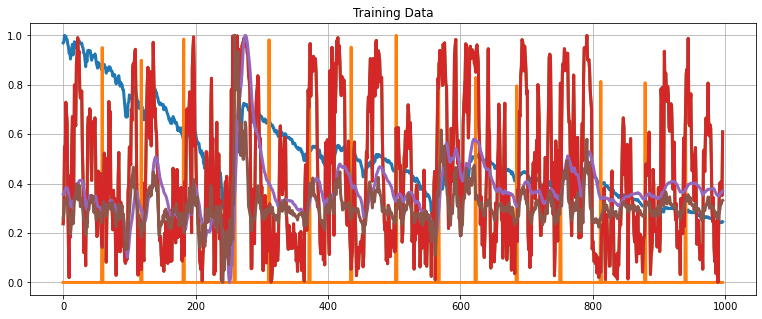

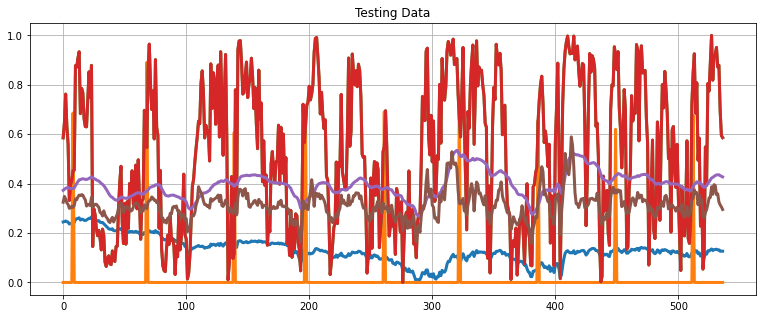

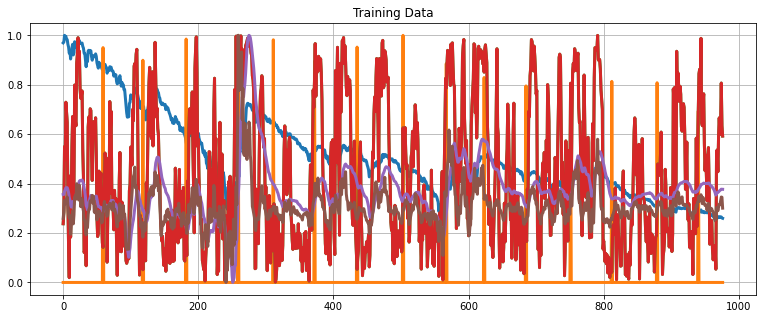

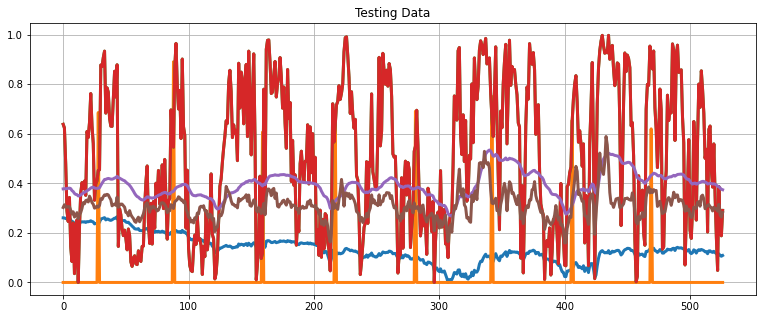

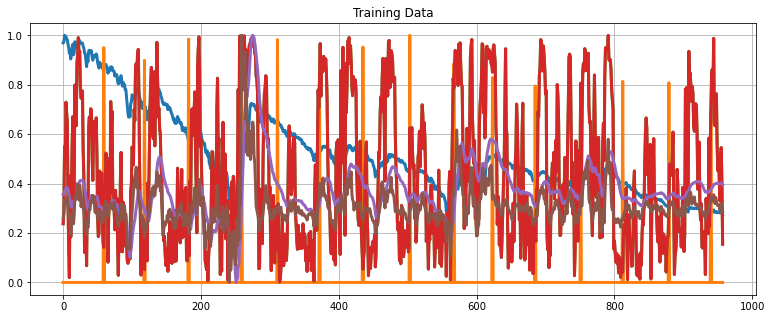

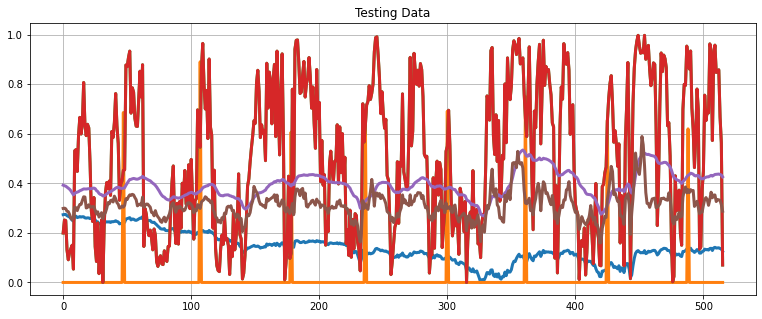

In [28]:
# volatile asset
windows = [1,10,30,60,90] 
for i in windows:
    pricePrediction_LR('VOO', i,starting_date )





In [29]:
time.sleep(60)

In [30]:
def pricePrediction_RandomForest(symbol,days, starting_date):
    p=0
    mse=[]
    rmse=[]
    rsquared=[]
    mae=[]
    
    #     obtain stock data
    stock_df= stock_data(symbol,starting_date)
    
    
    #     obtaining technical indicators
    stochastic_Oscillator(stock_df)
    calc_williams_r(stock_df)
    calc_macd(stock_df)
    calc_price_rate_of_change(stock_df)
    
    #     set the trading window we are trying to predict
    stock_df_targeted = trading_window(stock_df,days)
    
    stock_df_targeted.reset_index(inplace = True)
    stock_df_targeted = stock_df_targeted.dropna()
    
    stock_df_targeted_scaled= stock_df_targeted
#     stock_df_targeted_scaled.head(10)
    stock_df_targeted_scaled.drop(['Ticker','2. high','3. low', '5. adjusted close','7. dividend amount' ,'6. volume', '8. split coefficient', 'low_14','high_14','MACD_EMA'], axis = 1, inplace=True)
    
    
    stock_df_targeted_scaled = sc.fit_transform(stock_df_targeted_scaled.drop(columns = ['date']))
    
#     # Creating Feature and Target
    X = stock_df_targeted_scaled[:,:6]
    y = stock_df_targeted_scaled[:,6:]
     
    split = int(0.65 * len(X))
    X_train = X[:split]
    y_train = y[:split]
    X_test = X[split:]
    y_test = y[split:]

    show_plot(X_train, 'Training Data')
    show_plot(X_test, 'Testing Data')
    
    rf = RandomForestRegressor()
    
    rf.fit(X_train, y_train.ravel()) 
    pred_rf = rf.predict(X)
  
    print('MSE: ' +str(mean_squared_error(y, pred_rf)))
    print('RMSE: ' + str(math.sqrt(mean_squared_error(y, pred_rf))))
    print('Rsquaed: '+ str(r2_score(y, pred_rf)))
    print('MAE: ' + str(mean_absolute_error(y, pred_rf)))
    print('')
    
    
    Predicted = []
    for i in pred_rf:
        Predicted.append(i)
        
    close = []
    for i in stock_df_targeted_scaled:
        close.append(i[0])
        

    df_predicted = stock_df_targeted[['date']]
    df_predicted['Close'] = close
    df_predicted['Prediction'] = Predicted
    
    interactive_plot(df_predicted, "Original Vs. Prediction for " )
   
    

MSE: 0.005064497323708341
RMSE: 0.07116528172998643
Rsquaed: 0.9063295491640522
MAE: 0.04061457125782124



MSE: 0.007587434209540214
RMSE: 0.08710587930524676
Rsquaed: 0.8608605582485198
MAE: 0.05294293708870129



MSE: 0.008453959020301138
RMSE: 0.09194541326407282
Rsquaed: 0.8427082505105818
MAE: 0.05602069410188755



MSE: 0.008350705511350748
RMSE: 0.09138219471730118
Rsquaed: 0.8495374660245048
MAE: 0.056950560957977805



MSE: 0.009176864663127912
RMSE: 0.09579595327114769
Rsquaed: 0.8436588538357978
MAE: 0.05902623513225769



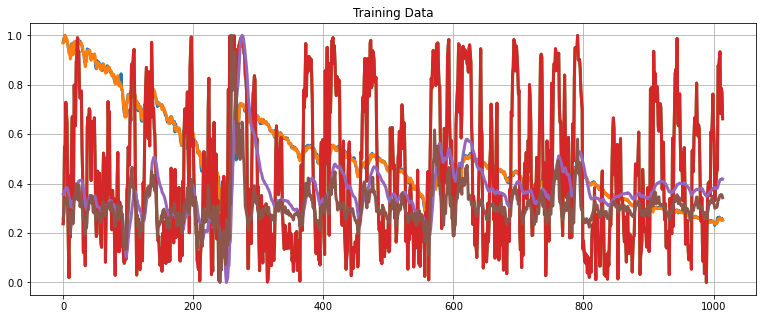

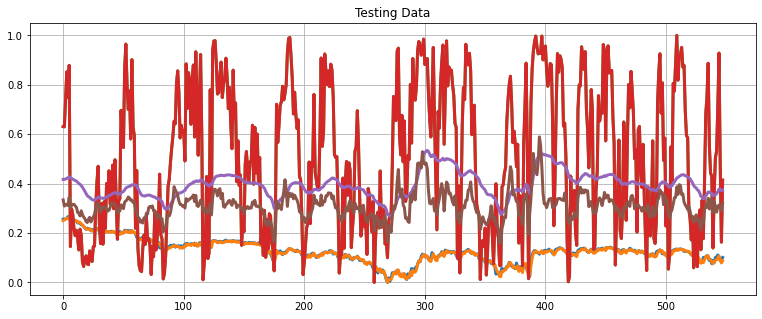

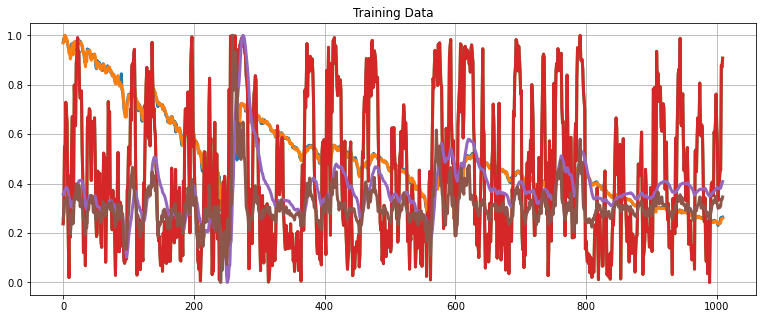

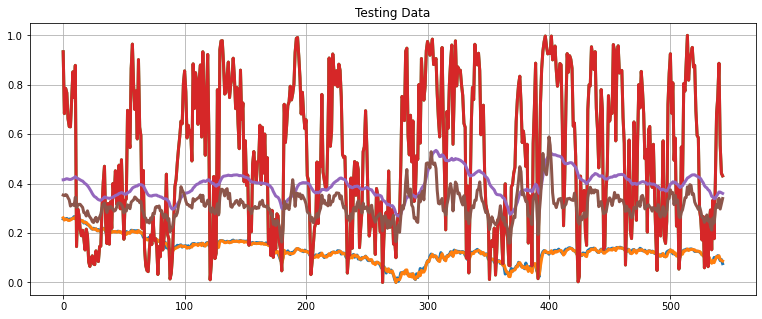

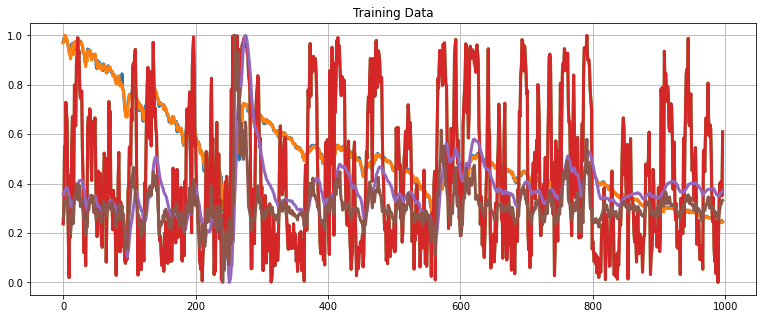

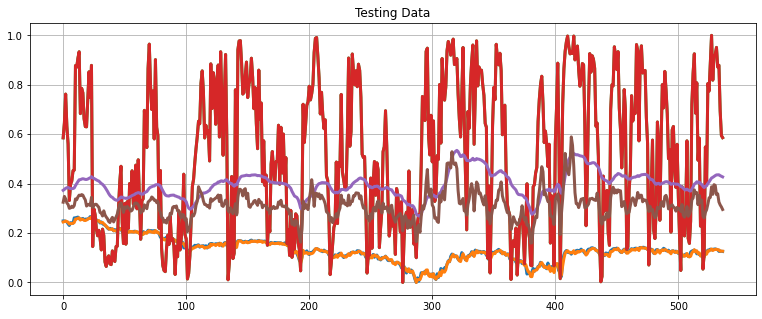

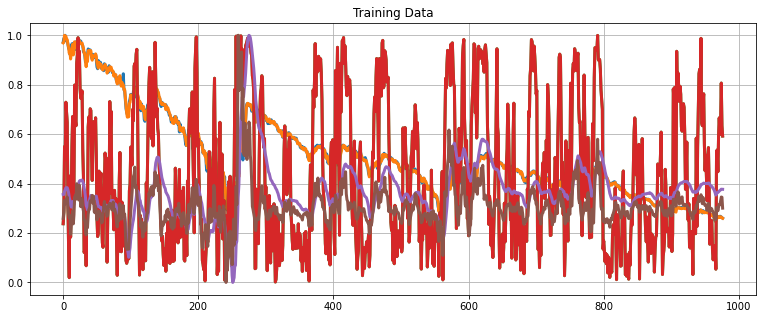

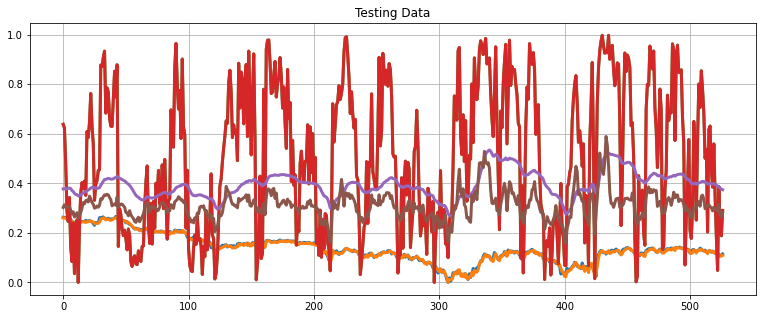

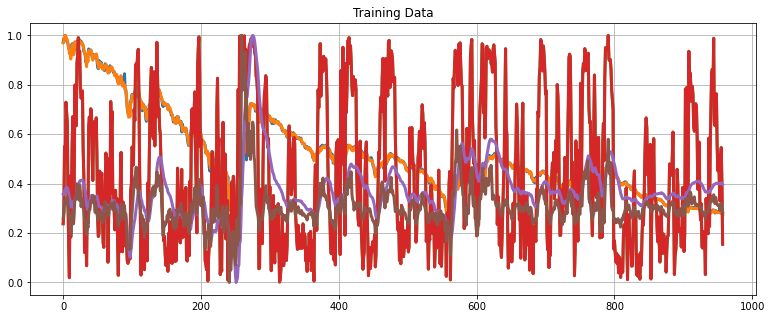

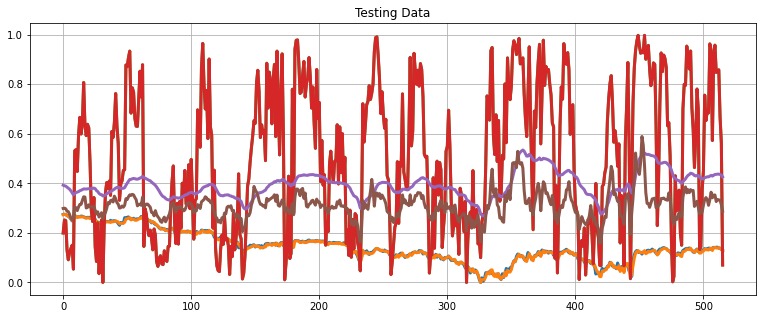

In [31]:
windows = [1,10,30,60,90]
for i in windows:
    pricePrediction_RandomForest('VOO', i,starting_date )



In [32]:
time.sleep(60)

In [33]:
def pricePrediction_LSTM(symbol,days, starting_date):
#     obtain stock data
    stock_df= stock_data(symbol,starting_date)
    
    
    #     obtaining technical indicators
    stochastic_Oscillator(stock_df)
    calc_williams_r(stock_df)
    calc_macd(stock_df)
    calc_price_rate_of_change(stock_df)
    
    stock_df.reset_index(inplace = True)
   
    #     set the trading window we are trying to predict
    stock_df_targeted = trading_window(stock_df,days)
    stock_df_targeted.drop(['Ticker','1. open','2. high','3. low', '5. adjusted close', '6. volume','7. dividend amount','8. split coefficient', 'low_14','high_14','MACD_EMA'], axis = 1, inplace=True)
    stock_df_targeted.dropna(inplace=True)
    training_data_X = stock_df_targeted.iloc[:, 1:6].values
    training_data_y = stock_df_targeted.iloc[:, 6:].values
    
    stock_df_targeted_scaled= sc.fit_transform(stock_df_targeted.drop(columns = ['date']))

    X = sc.fit_transform(training_data_X)
    y = sc.fit_transform(training_data_y)
    
    
    # Convert the data into array format
    X = np.asarray(X)
    y = np.asarray(y)
    
    # Split the data
    split = int(0.7 * len(X))
    X_train = X[:split]
    y_train = y[:split]
    X_test = X[split:]
    y_test = y[split:]
    
    # Reshape the 1D arrays to 3D arrays to feed in the model
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
    X_train.shape, X_test.shape

    # Create the model
    inputs = keras.layers.Input(shape=(X_train.shape[1], X_train.shape[2]))
    x = keras.layers.LSTM(150, return_sequences= True)(inputs)
    x = keras.layers.Dropout(0.3)(x)
    x = keras.layers.LSTM(150, return_sequences=True)(x)
    x = keras.layers.Dropout(0.3)(x)
    x = keras.layers.LSTM(150)(x)
    outputs = keras.layers.Dense(1, activation='linear')(x)

    model = keras.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss="mse", metrics=['mean_squared_error', 'mae'])
    model.summary()
    
    # Trai the model
    history = model.fit(
        X_train, y_train,
        epochs = 20,
        batch_size = 32,
        validation_split = 0.2
    )
    
    predicted = model.predict(X)
    
    test_predicted = []

    for i in predicted:
      test_predicted.append(i[0])
    
    close = []
    for i in stock_df_targeted_scaled:
        close.append(i[0])
        
    df_predicted = stock_df_targeted[['date']]
    df_predicted['Close'] = close
    df_predicted['Prediction'] = predicted
    
#     interactive_plot(df_predicted, "Original Vs. Prediction for " )
    scores = model.evaluate(X, y, verbose=0)
    
    print("MSE:" + str((scores[0])))
    print("MAE:" + str((scores[1])))
    print('R2 Score: ', r2_score(y, predicted))
    # Plot the data
    interactive_plot(df_predicted, "Original Vs Prediction")
    
   

In [34]:
 pricePrediction_LSTM('VOO', 1,starting_date )

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 5, 1)]            0         
_________________________________________________________________
lstm (LSTM)                  (None, 5, 150)            91200     
_________________________________________________________________
dropout (Dropout)            (None, 5, 150)            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 5, 150)            180600    
_________________________________________________________________
dropout_1 (Dropout)          (None, 5, 150)            0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 150)               180600    
_________________________________________________________________
dense (Dense)                (None, 1)                 151   

In [35]:
windows = [1,10,30,60,90]
for i in windows:
    pricePrediction_LSTM('VOO', i,starting_date )



Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 5, 1)]            0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 5, 150)            91200     
_________________________________________________________________
dropout_2 (Dropout)          (None, 5, 150)            0         
_________________________________________________________________
lstm_4 (LSTM)                (None, 5, 150)            180600    
_________________________________________________________________
dropout_3 (Dropout)          (None, 5, 150)            0         
_________________________________________________________________
lstm_5 (LSTM)                (None, 150)               180600    
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 151 

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 5, 1)]            0         
_________________________________________________________________
lstm_6 (LSTM)                (None, 5, 150)            91200     
_________________________________________________________________
dropout_4 (Dropout)          (None, 5, 150)            0         
_________________________________________________________________
lstm_7 (LSTM)                (None, 5, 150)            180600    
_________________________________________________________________
dropout_5 (Dropout)          (None, 5, 150)            0         
_________________________________________________________________
lstm_8 (LSTM)                (None, 150)               180600    
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 151 

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 5, 1)]            0         
_________________________________________________________________
lstm_9 (LSTM)                (None, 5, 150)            91200     
_________________________________________________________________
dropout_6 (Dropout)          (None, 5, 150)            0         
_________________________________________________________________
lstm_10 (LSTM)               (None, 5, 150)            180600    
_________________________________________________________________
dropout_7 (Dropout)          (None, 5, 150)            0         
_________________________________________________________________
lstm_11 (LSTM)               (None, 150)               180600    
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 151 

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 5, 1)]            0         
_________________________________________________________________
lstm_12 (LSTM)               (None, 5, 150)            91200     
_________________________________________________________________
dropout_8 (Dropout)          (None, 5, 150)            0         
_________________________________________________________________
lstm_13 (LSTM)               (None, 5, 150)            180600    
_________________________________________________________________
dropout_9 (Dropout)          (None, 5, 150)            0         
_________________________________________________________________
lstm_14 (LSTM)               (None, 150)               180600    
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 151 

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 5, 1)]            0         
_________________________________________________________________
lstm_15 (LSTM)               (None, 5, 150)            91200     
_________________________________________________________________
dropout_10 (Dropout)         (None, 5, 150)            0         
_________________________________________________________________
lstm_16 (LSTM)               (None, 5, 150)            180600    
_________________________________________________________________
dropout_11 (Dropout)         (None, 5, 150)            0         
_________________________________________________________________
lstm_17 (LSTM)               (None, 150)               180600    
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 151 